In [18]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import RANSACRegressor
from matplotlib.patches import Patch
import matplotlib.font_manager as fm
from IPython.display import display, HTML
import numpy as np



In [4]:
def initialize_notebook():
    # Display settings for the Jupyter notebook
    display(HTML("<style>:root { --jp-notebook-max-width: 95% !important; }</style>"))
    # Add the font to the font manager
    #fm.fontManager.addfont('/projects/p30802/Cydney/Arial.ttf')
    # Set the font globally
    #plt.rc('font', family='Arial')
    # Set default figure size and DPI
    plt.rcParams['figure.figsize'] = (1.7, 1.6)
    plt.rcParams['figure.dpi'] = 400
    # Set default grid settings
    plt.rcParams['axes.grid'] = True
    plt.rcParams['grid.color'] = '0.8'
    plt.rcParams['grid.linestyle'] = '-'
    plt.rcParams['grid.linewidth'] = 0.3
    plt.rcParams['grid.alpha'] = 0.3
    # Set default tick parameters
    plt.rcParams['xtick.labelsize'] = 6
    plt.rcParams['ytick.labelsize'] = 6
    plt.rcParams['xtick.major.width'] = 0.25
    plt.rcParams['ytick.major.width'] = 0.25
    plt.rcParams['xtick.major.size'] = 2  # This is the length
    plt.rcParams['ytick.major.size'] = 2  # This is the length
    plt.rcParams['xtick.major.pad'] = 2
    plt.rcParams['ytick.major.pad'] = 2
    # Set default spine width
    plt.rcParams['axes.linewidth'] = 0.25
    # Set default labels and title size
    plt.rcParams['axes.labelsize'] = 6
    plt.rcParams['axes.titlesize'] = 7
    plt.rcParams['axes.labelpad'] = 0.5
    # Set default legend settings
    plt.rcParams['legend.fontsize'] = 5
    plt.rcParams['legend.title_fontsize'] = 6
    # Automatically apply the function to remove spines whenever a figure is created
    plt.rcParams['axes.spines.top'] = False
    plt.rcParams['axes.spines.right'] = False

initialize_notebook()

## Reading in Data

In [14]:
#Datasets from the publication Global Analysis of Aggregation Determinants in Small Protein Domains can be downloaded from Zenodo : https://doi.org/10.5281/zenodo.17477631
meta1 = pd.read_csv("/Users/cydneymartell/Desktop/Datasets_for_publishing_v2/MS_Intensity_AggregationCalcs_Metagenomic_1.csv")[['name', 'protein_sequence', 'SPEC_COUNT', 'SEQ_COUNT',
       'norm_total_126.127726', 'norm_total_127.124761',
       'norm_total_127.131081', 'norm_total_128.128116',
       'norm_total_128.134436', 'norm_total_129.131471',
       'norm_total_129.13779', 'norm_total_130.134825',
       'norm_total_130.141145', 'norm_total_131.13818', 'norm_total_131.1445',
       'norm_total_132.141535', 'norm_total_132.147855',
       'norm_total_133.14489', 'norm_total_133.15121', 'norm_total_134.148245',]]
meta2 = pd.read_csv("/Users/cydneymartell/Desktop/Datasets_for_publishing_v2/MS_Intensity_AggregationCalcs_Metagenomic_2.csv")[['name', 'protein_sequence', 'SPEC_COUNT', 'SEQ_COUNT',
       'norm_total_126.127726', 'norm_total_127.124761',
       'norm_total_127.131081', 'norm_total_128.128116',
       'norm_total_128.134436', 'norm_total_129.131471',
       'norm_total_129.13779', 'norm_total_130.134825',
       'norm_total_130.141145', 'norm_total_131.13818', 'norm_total_131.1445',
       'norm_total_132.141535', 'norm_total_132.147855',
       'norm_total_133.14489', 'norm_total_133.15121', 'norm_total_134.148245']]
prot_fam = pd.read_csv("/Users/cydneymartell/Desktop/Datasets_for_publishing_v2/MS_Intensity_AggregationCalcs_Protein_Fam.csv")[['name', 'protein_sequence', 'SPEC_COUNT', 'SEQ_COUNT',
       'norm_total_126.127726', 'norm_total_127.124761',
       'norm_total_127.131081', 'norm_total_128.128116',
       'norm_total_128.134436', 'norm_total_129.131471',
       'norm_total_129.13779', 'norm_total_130.134825',
       'norm_total_130.141145', 'norm_total_131.13818', 'norm_total_131.1445',
       'norm_total_132.141535', 'norm_total_132.147855',
       'norm_total_133.14489', 'norm_total_133.15121', 'norm_total_134.148245']]

ordered_proteins = pd.read_csv("/Users/cydneymartell/Desktop/Datasets_for_publishing_v2/Ordered_Libraries.csv")
cond=["start",25,50,75,7,4]
labels = [126.127726,127.124761,127.131081,128.128116,128.134436,129.131471,129.13779,130.134825,130.141145,131.13818,131.1445,132.141535,132.147855,133.14489,133.15121,134.148245]


## Change in total protein concentration from aggregation experiment 

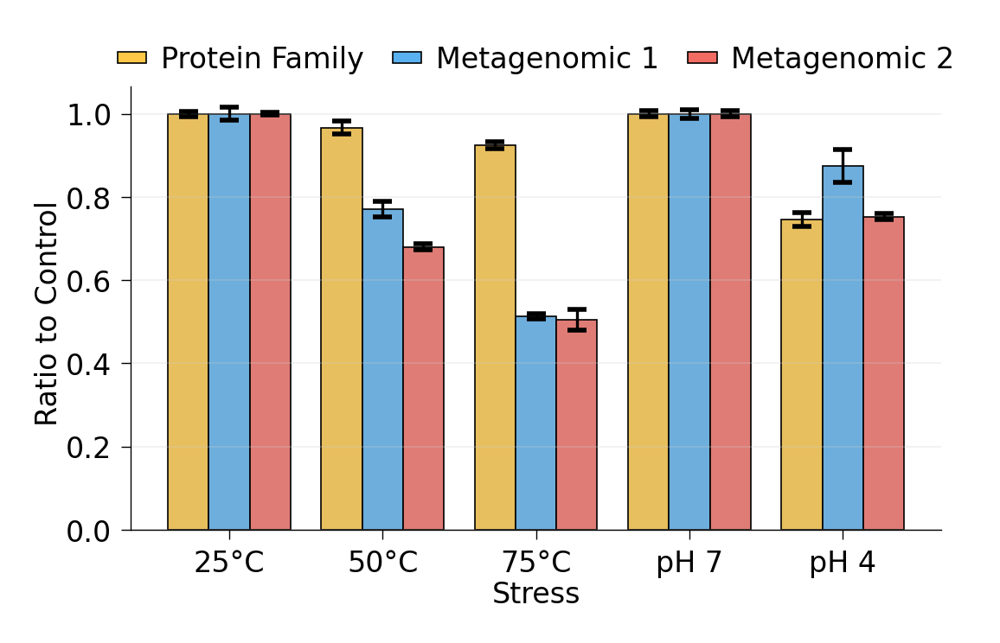

In [19]:
color_m1 = "#5AB1EF"   
color_m2  = "#F26C64"   
color_pf = "#FFC847"

bca_sup = pd.read_csv("/Users/cydneymartell/Documents/AggregationAnalysis/Data_Processing_Filtering/BCA_assay_sup_agg_exp.csv")
order = ["25","50","75","7","4"]
libs = [i  for _ in range(5) for i in bca_sup["lib"] ]
y_vals = [i for o in order for i in bca_sup["ratio_" + o].values]
error_vals = [i for o in order for i in bca_sup["SE_ratio_" + o].values]
x_vals = ["ratio_" + o  for o in order for _ in range(3)]
bca_plot = pd.DataFrame([libs,x_vals,y_vals,error_vals]).T
bca_plot.columns = ["lib","stress","ratio","ratio_SE"]
plt.figure(figsize=(3, 2))
ax=sns.barplot(data = bca_plot,x="stress",y="ratio",hue="lib",palette=[color_pf,color_m1,color_m2],edgecolor="black",linewidth=0.3,dodge=0.3)

for i, bar in enumerate(ax.patches):
    if bar.get_height() == 0 and bar.get_width() == 0:
        continue  # skip dummy bar
    height = bar.get_height()
    x = bar.get_x() + bar.get_width() / 2.0
    err = bca_plot["ratio_SE"].iloc[i]
    ax.errorbar(x, height, yerr=err, ecolor='black', capsize=2, fmt='none', lw=0.6)

# Legend for full figure
legend_elements = [
    Patch(facecolor=color_pf, edgecolor='black', linewidth=0.3, label='Protein Family'),
    Patch(facecolor=color_m1, edgecolor='black', linewidth=0.3, label='Metagenomic 1'),
    Patch(facecolor=color_m2, edgecolor='black', linewidth=0.3, label='Metagenomic 2')
]

ax.legend(
    handles=legend_elements,
    loc='upper center',
    ncol=3,
    frameon=False,
    fontsize=6,
    handletextpad=0.5,
    columnspacing=1.0,
    bbox_to_anchor=(0.5, 1.15),
    handleheight=0.2,handlelength=1
)
ax.set_ylabel("Ratio to Control ")
ax.set_xlabel("Stress")
ax.set_xticklabels(["25°C","50°C","75°C","pH 7", "pH 4"])
plt.tight_layout()


plt.show()

## Calculations 

In [39]:
def process_tmt_dataframe(df,dropna=True,start_channel="134.148245"):
    """
    Process TMT normalized intensity dataframe from the MS to calculate fold change

    Inputs:
        df: Dataframe with norm_total_* columns containing MS data
        dropna : boolean defining whether to drop rows with NaNs before processing
        start_channel : TMT channel used to label the starting sample not exposed to any experimental manipulation

    Outputs:
        df : Dataframe with fold change calculations
    """

    if dropna:
        df = df.dropna().copy()
    
    #TMT labels use dfor each conditions
    cond = {
        25: ["126.127726", "127.124761", "127.131081"],
        50: ["128.128116", "128.134436", "129.131471"],
        75: ["129.13779",  "130.134825", "130.141145"],
        7:  ["131.13818",  "131.1445",   "132.141535"],
        4:  ["132.147855", "133.14489",  "133.15121"],
    }

    # Calculate the log10 of the TMT intensity for each condition
    for c in cond.values():
        for ch in c:
            df[f"log10_norm_total_{ch}"] = np.log10(df[f"norm_total_{ch}"])

    df[f"log10_norm_total_{start_channel}"] = np.log10(df[f"norm_total_{start_channel}"])
    df[f"log10_norm_total_start"] = np.log10(df[f"norm_total_{start_channel}"])
    #Calculate the average and standard deviation
    for cond, reps in cond.items():
        cols = [f"norm_total_{r}" for r in reps]

        df[f"avg_norm_total_{cond}"] = df[cols].mean(axis=1)
        df[f"std_norm_total_{cond}"] = df[cols].std(axis=1)
        df[f"log10_avg_norm_total_{cond}"] = np.log10(df[f"avg_norm_total_{cond}"])

    #Calculate fold change 
    df["avg_norm_total_50_div_avg_norm_total_25"] = (df["avg_norm_total_50"] / df["avg_norm_total_25"])
    df["avg_norm_total_75_div_avg_norm_total_25"] = (df["avg_norm_total_75"] / df["avg_norm_total_25"])
    df["avg_norm_total_7_div_avg_norm_total_25"] = (df["avg_norm_total_7"] / df["avg_norm_total_25"])
    df["avg_norm_total_4_div_avg_norm_total_7"] = (df["avg_norm_total_4"] / df["avg_norm_total_7"])
    df["avg_norm_total_25_div_norm_total_start"] = (df["avg_norm_total_25"] / df[f"norm_total_{start_channel}"] )
    df["avg_norm_total_7_div_norm_total_start"] = (df["avg_norm_total_7"] / df[f"norm_total_{start_channel}"])

    # Calculate log2 fold change for each stress condition 
    for col in [
        "avg_norm_total_50_div_avg_norm_total_25",
        "avg_norm_total_75_div_avg_norm_total_25",
        "avg_norm_total_4_div_avg_norm_total_7",
        "avg_norm_total_7_div_avg_norm_total_25",
        "avg_norm_total_25_div_norm_total_start",
        "avg_norm_total_7_div_norm_total_start",
    ]:
        df[f"log2_{col}"] = np.log2(df[col])


    return df


In [40]:
meta1_fc = process_tmt_dataframe(meta1)
meta2_fc = process_tmt_dataframe(meta2)
prot_fam_fc = process_tmt_dataframe(prot_fam)

## Investigating the Reproducibility across technical replicates

Text(0.5, 1.0, 'Meta1 \n Correlation between the log10 transformed total intensities of the TMT channels')

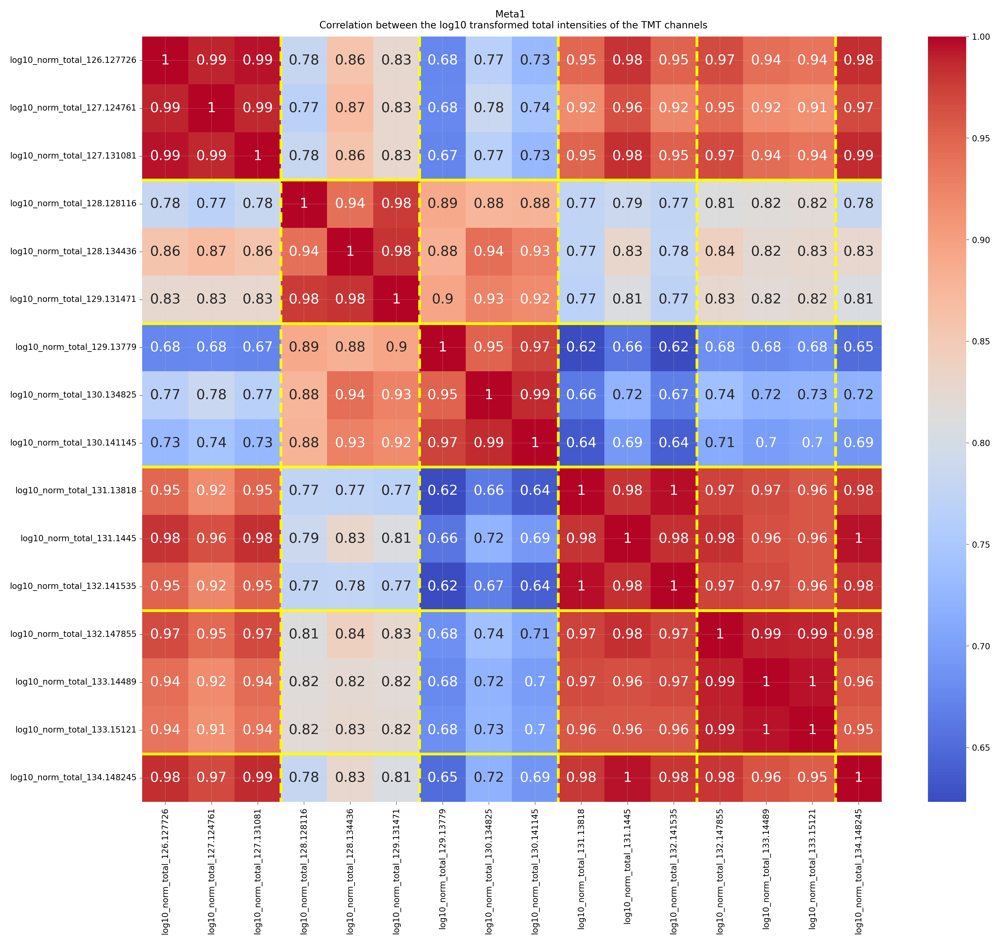

In [41]:
#correlation plot of the log10 normalized intensity values for each TMT channel
plt.figure(figsize=(12,10))
g=sns.heatmap(meta1_fc[["log10_norm_total_"+str(i) for i in labels]].corr(method = "pearson"), cmap="coolwarm", annot=True)
g.hlines([3, 6, 9, 12, 15], *g.get_xlim(), linewidth =2, color = "yellow")
g.vlines([3, 6, 9,12,15], *g.get_xlim(), linewidth =2, color = "yellow", linestyle="--")
plt.title("Meta1 \n Correlation between the log10 transformed total intensities of the TMT channels")


Text(0.5, 1.0, 'Meta2 \n Correlation between the log10 transformed total intensities of the TMT channels')

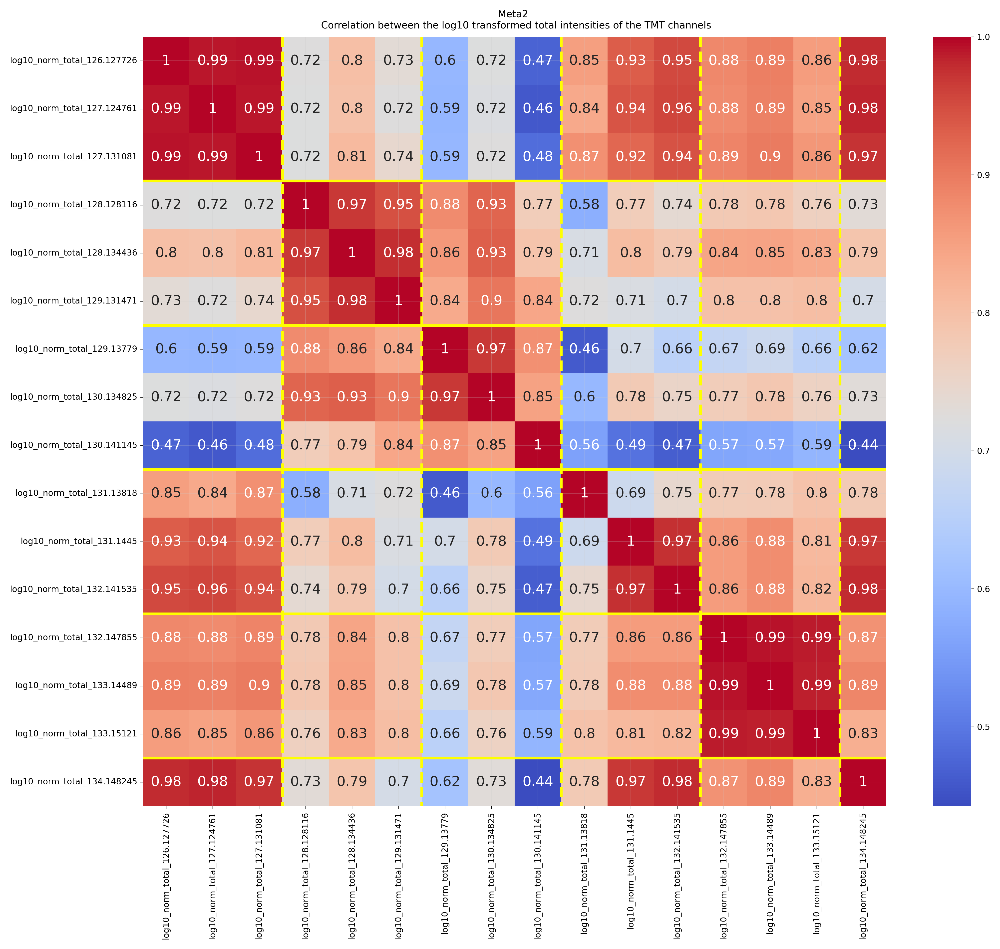

In [42]:
#correlation plot of the log10 normalized intensity values for each TMT channel
plt.figure(figsize=(12,10))
g=sns.heatmap(meta2_fc[["log10_norm_total_"+str(i) for i in labels]].corr(method = "pearson"), cmap="coolwarm", annot=True)
g.hlines([3, 6, 9, 12, 15], *g.get_xlim(), linewidth =2, color = "yellow")
g.vlines([3, 6, 9,12,15], *g.get_xlim(), linewidth =2, color = "yellow", linestyle="--")
plt.title("Meta2 \n Correlation between the log10 transformed total intensities of the TMT channels")

<Axes: xlabel='log10_norm_total_131.1445', ylabel='log10_norm_total_132.141535'>

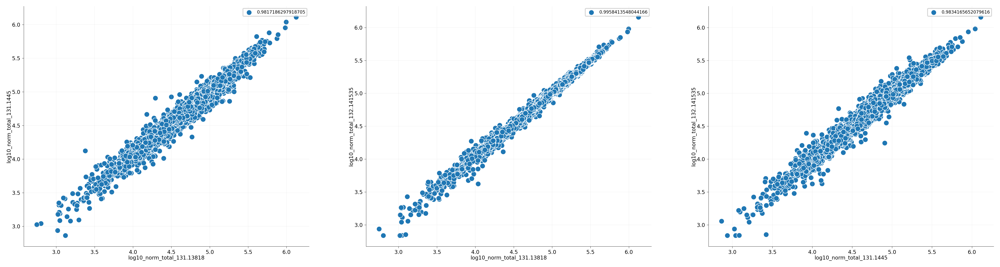

In [43]:
fig, axs = plt.subplots(1, 3, figsize=(20, 5))

sns.scatterplot(x="log10_norm_total_131.13818", y="log10_norm_total_131.1445", data=meta1_fc, ax=axs[0], label = meta1_fc[['log10_norm_total_131.13818', 'log10_norm_total_131.1445']].corr().iloc[0,1])
sns.scatterplot(x="log10_norm_total_131.13818", y="log10_norm_total_132.141535", data=meta1_fc, ax=axs[1], label = meta1_fc[['log10_norm_total_131.13818', 'log10_norm_total_132.141535']].corr().iloc[0,1])
sns.scatterplot(x="log10_norm_total_131.1445", y="log10_norm_total_132.141535", data=meta1_fc, ax=axs[2], label = meta1_fc[['log10_norm_total_131.1445', 'log10_norm_total_132.141535']].corr().iloc[0,1])

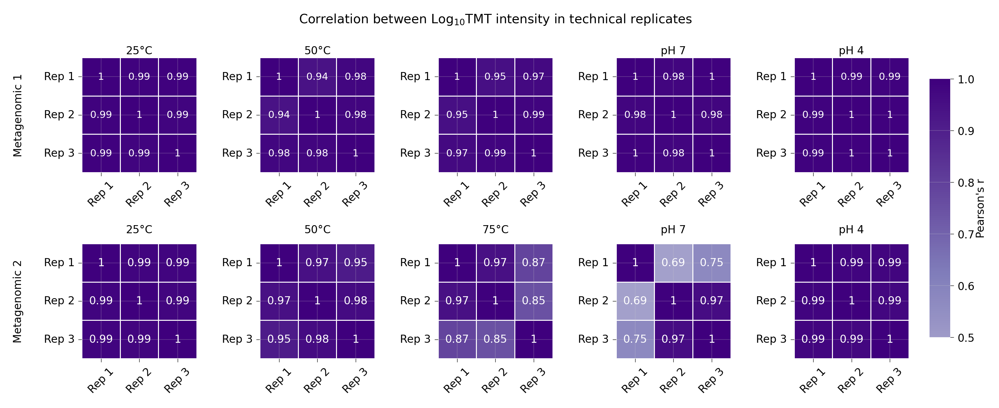

In [44]:
#correlation plot of the log10 normalized intensity values for each TMT channel
cond=["25°C","50°C", "75°C", "pH 7", "pH 4"]
fig, axs = plt.subplots(2,5,figsize=(8,8),gridspec_kw={'height_ratios': [1.5, 1.5]})
tech_reps = [0,3,6,9,12,15]
# Add a new axis for the color bar
cbar_ax = fig.add_axes([0.92, 0.35, 0.02, 0.25])  # Adjust the position and size of the color bar
vmin, vmax = 0.5, 1.0

for i in range(2):
    for k in range(1,6):
        if i == 0:
            g=sns.heatmap(meta1_fc[["log10_norm_total_"+str(i) for i in labels[tech_reps[k-1]:tech_reps[k]]]].corr(method = "pearson"),ax=axs[i,k-1], cmap="Purples", center =0.5,annot=True,cbar=(i == 0 and k == 1), 
                cbar_ax=None if (i != 0 or k != 1) else cbar_ax,cbar_kws={"label": "Pearson's r"},annot_kws={"fontsize": 5.5},vmin=vmin, vmax=vmax, square = True, linewidths = 0.5, linecolor = "white")
            axs[i,k-1].set_xticklabels(["Rep " +  str(j+1) for j in range(3)], rotation=45,fontsize = 6)
            axs[i,k-1].set_yticklabels([ "Rep " +  str(j+1) for j in range(3)],fontsize = 6)
            axs[i,k-1].set_title(cond[k-1],fontsize = 6, pad = 2)
         
        else:
            h=sns.heatmap(meta2_fc[["log10_norm_total_"+str(i) for i in labels[tech_reps[k-1]:tech_reps[k]]]].corr(method = "pearson"),ax=axs[i,k-1],annot_kws={"fontsize": 6}, cmap="Purples",center =0.7,linewidth = 0.5,  annot=True, cbar = False,  square = True)
            axs[i,k-1].set_xticklabels([ "Rep " +  str(j+1) for j in range(3)], rotation=45, fontsize =6)
            axs[i,k-1].set_yticklabels([ "Rep " +  str(j+1) for j in range(3)], fontsize = 6)
            axs[i,k-1].set_title(cond[k-1],fontsize = 6)

plt.text(-6.75, 0.5, 'Metagenomic 1', ha='center',color = "black", rotation = 90,fontsize = 6,va='center', transform=g.transAxes)
plt.text(-6.8, 0.5, 'Metagenomic 2', ha='left', va='center',color = "black", rotation = 90,fontsize = 6,transform=h.transAxes)
axs[0,2].set_title("Correlation between " r"$\text{Log}_{10}$" "TMT intensity in technical replicates", va='top', fontsize =7,pad = 25)

# Set font size of color bar label
cbar_ax.yaxis.label.set_size(6)
plt.subplots_adjust(wspace=0.55, hspace=0.06, top=0.65, bottom=0.3, left=0.1, right=0.9)

plt.show()

#### There is good agreement between control samples

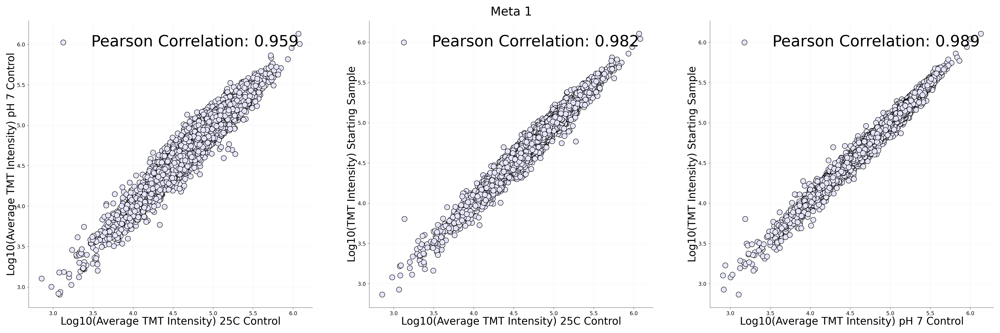

In [45]:
fig, axs = plt.subplots(1, 3, figsize=(20, 6))

sns.scatterplot(x="log10_avg_norm_total_25", y="log10_avg_norm_total_7", data=meta1_fc, ax =axs[0],color = "lavender", edgecolor = "black")
axs[0].set_xlabel("Log10(Average TMT Intensity) 25C Control",fontsize = 12) 
axs[0].set_ylabel("Log10(Average TMT Intensity) pH 7 Control",fontsize = 12)

sns.scatterplot(x="log10_avg_norm_total_25", y="log10_norm_total_start", data=meta1_fc, ax =axs[1],color = "lavender", edgecolor = "black")
axs[1].set_xlabel("Log10(Average TMT Intensity) 25C Control",fontsize = 12)
axs[1].set_ylabel("Log10(TMT Intensity) Starting Sample",fontsize = 12)
axs[1].set_title("Meta 1", fontsize = 14)
sns.scatterplot(x="log10_avg_norm_total_7", y="log10_norm_total_start", data = meta1_fc, ax =axs[2],color = "lavender", edgecolor = "black")
axs[2].set_xlabel("Log10(Average TMT Intensity) pH 7 Control", fontsize = 12)
axs[2].set_ylabel("Log10(TMT Intensity) Starting Sample",fontsize = 12)

axs[0].legend(["Pearson Correlation: " + str(np.round(meta1_fc[['log10_avg_norm_total_25','log10_avg_norm_total_7']].corr().values[0][1],3))], frameon = False, fontsize = 18)
axs[1].legend(["Pearson Correlation: " +str(np.round(meta1_fc[['log10_avg_norm_total_25','log10_norm_total_start']].corr().values[0][1],3))], frameon = False,fontsize = 18)
axs[2].legend(["Pearson Correlation: " + str(np.round(meta1_fc[['log10_avg_norm_total_7','log10_norm_total_start']].corr().values[0][1],3))], frameon=False,fontsize = 18)

sns.despine(top = True, right = True)

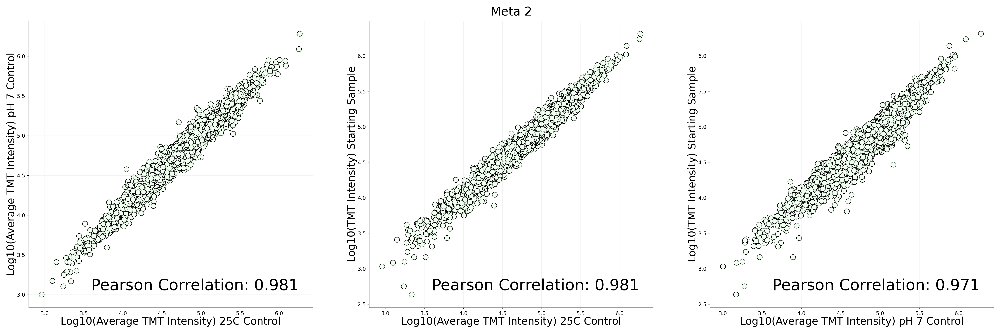

In [49]:
fig, axs = plt.subplots(1, 3, figsize=(20, 6))

sns.scatterplot(x="log10_avg_norm_total_25", y="log10_avg_norm_total_7", data=meta2_fc, ax =axs[0],color = "honeydew", edgecolor = "black")
axs[0].set_xlabel("Log10(Average TMT Intensity) 25C Control",fontsize = 12) 
axs[0].set_ylabel("Log10(Average TMT Intensity) pH 7 Control",fontsize = 12)

sns.scatterplot(x="log10_avg_norm_total_25", y="log10_norm_total_start", data=meta2_fc, ax =axs[1],color = "honeydew", edgecolor = "black")
axs[1].set_xlabel("Log10(Average TMT Intensity) 25C Control",fontsize = 12)
axs[1].set_ylabel("Log10(TMT Intensity) Starting Sample",fontsize = 12)
axs[1].set_title("Meta 2", fontsize = 14)
sns.scatterplot(x="log10_avg_norm_total_7", y="log10_norm_total_start", data = meta2_fc, ax =axs[2],color = "honeydew", edgecolor = "black")
axs[2].set_xlabel("Log10(Average TMT Intensity) pH 7 Control", fontsize = 12)
axs[2].set_ylabel("Log10(TMT Intensity) Starting Sample",fontsize = 12)

axs[0].legend(["Pearson Correlation: " + str(np.round(meta2_fc[['log10_avg_norm_total_25','log10_avg_norm_total_7']].corr().values[0][1],3))], frameon = False, fontsize = 18, loc = "lower right")
axs[1].legend(["Pearson Correlation: " +str(np.round(meta2_fc[['log10_avg_norm_total_25','log10_norm_total_start']].corr().values[0][1],3))], frameon = False,fontsize = 18,loc = "lower right")
axs[2].legend(["Pearson Correlation: " + str(np.round(meta2_fc[['log10_avg_norm_total_7','log10_norm_total_start']].corr().values[0][1],3))], frameon=False,fontsize = 18,loc = "lower right")

sns.despine(top = True, right = True)

## Initial plotting of the data to see what it looks like

#### Most proteins have a starting log10 TMT intensity between 5 and 7

<Axes: xlabel='log10_norm_total_start', ylabel='Count'>

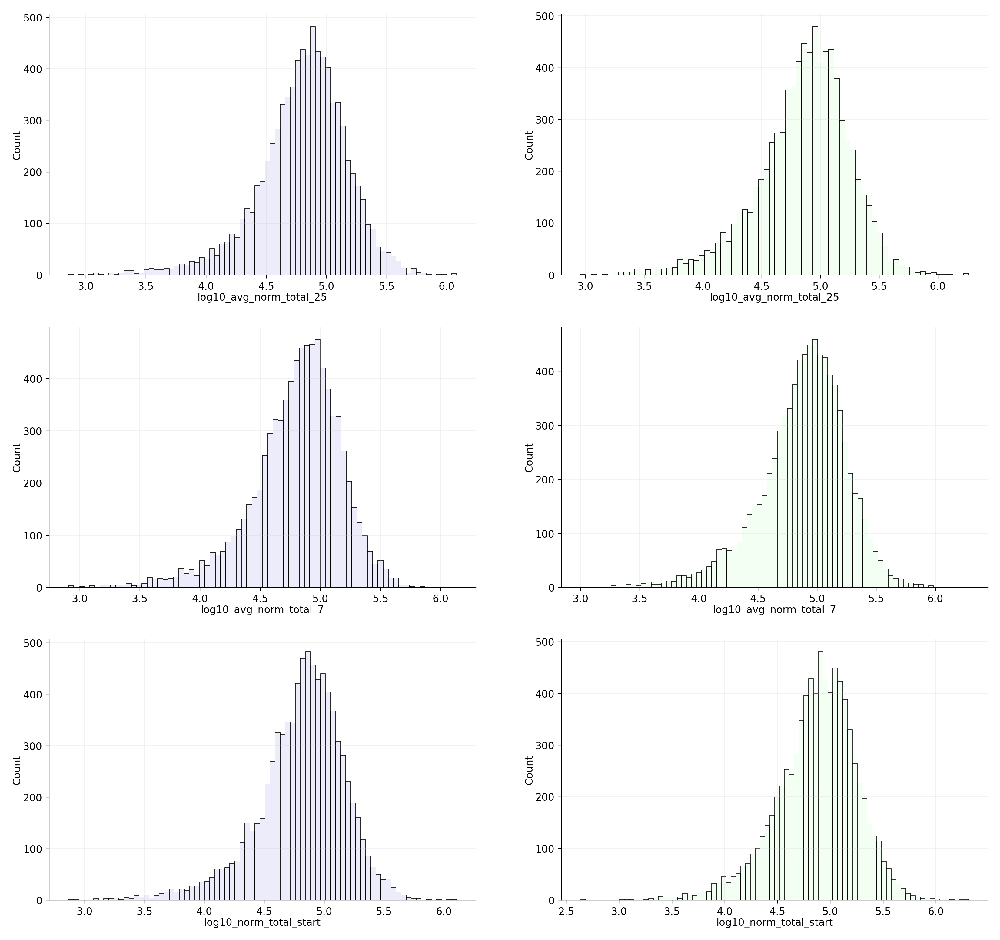

In [51]:
fig,axs = plt.subplots(3,2, figsize = (10,9.5))
sns.histplot(meta1_fc['log10_avg_norm_total_25'], ax = axs[0,0], color = "lavender")
sns.histplot(meta2_fc['log10_avg_norm_total_25'], ax = axs[0,1], color = "honeydew")


sns.histplot(meta1_fc['log10_avg_norm_total_7'], ax = axs[1,0], color = "lavender")
sns.histplot(meta2_fc['log10_avg_norm_total_7'], ax = axs[1,1], color = "honeydew")

sns.histplot(meta1_fc['log10_norm_total_start'], ax = axs[2,0], color = "lavender")
sns.histplot(meta2_fc['log10_norm_total_start'], ax = axs[2,1], color = "honeydew")

In [52]:
meta1_fc

,name,protein_sequence,SPEC_COUNT,SEQ_COUNT,norm_total_126.127726,norm_total_127.124761,norm_total_127.131081,norm_total_128.128116,norm_total_128.134436,norm_total_129.131471,...,avg_norm_total_7_div_avg_norm_total_25,avg_norm_total_4_div_avg_norm_total_7,avg_norm_total_25_div_norm_total_start,avg_norm_total_7_div_norm_total_start,log2_avg_norm_total_50_div_avg_norm_total_25,log2_avg_norm_total_75_div_avg_norm_total_25,log2_avg_norm_total_4_div_avg_norm_total_7,log2_avg_norm_total_7_div_avg_norm_total_25,log2_avg_norm_total_25_div_norm_total_start,log2_avg_norm_total_7_div_norm_total_start
0,rocklin_batch2_100,HMKWIEILKSKDGNYALLQDEKDTQFVVASGYNPDAAEDQKWGHGS...,4,4,129568.75,140761.25,121524.75,25708.00,54002.00,36091.25,...,0.740800,0.640344,1.147228,0.849867,-1.758668,-1.573905,-0.643080,-0.432844,0.198152,-0.234691
1,rocklin_batch2_271,HMQEPADDTRYADLRRWWVRLISLRSDLGDWAELTGRHTETLVIAR...,16,16,29795.00,32176.38,31674.94,22237.94,26835.94,23510.00,...,0.882338,1.073689,1.089848,0.961615,-0.367573,-1.583605,0.102576,-0.180596,0.124128,-0.056468
2,rocklin_batch2_280,HMLSDLTPGDLVVHATHGIGRFLGIRKLELEGMTKDYITIQYRGNE...,38,38,45902.95,42430.87,44126.03,49352.39,40818.89,47722.76,...,1.153792,0.742818,0.939191,1.083632,0.058005,-0.361803,-0.428918,0.206384,-0.090509,0.115875
3,rocklin_batch2_341,HMSTPTVDTKTKLDLYNLLYKKDLNYLDAYNFVLDNFGSDNIDIMF...,8,8,102764.50,106566.88,94519.00,126096.50,133142.38,138189.50,...,0.904615,1.129644,1.169926,1.058334,0.387334,0.778124,0.175868,-0.144623,0.226418,0.081794
4,rocklin_batch2_342,HMDQDMTPGELTDNMLEAGFSREDADGYLALGWQMTWAKWWKFHRQ...,4,4,6497.75,5313.00,5588.75,9700.25,4838.75,7923.25,...,1.344406,0.680938,0.846846,1.138505,0.368457,0.144688,-0.554405,0.426969,-0.239829,0.187140
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8293,A0A0D3A1T2_34-70,HMYATQLLQLEEMGFFDRAENIRALRATNGNVNAAVERL,9,9,22836.33,24393.67,23885.78,29395.56,28420.33,33117.33,...,1.026662,0.986649,0.956676,0.982183,0.354638,0.656726,-0.019391,0.037962,-0.063898,-0.025936
8294,V4NL25_317-353,HMIDEEIIQEVIKLGFDRNQVIGSLVSRIQNEATVAYYL,5,5,91728.00,109340.67,110897.00,141202.00,140740.33,141000.67,...,0.972526,0.693730,0.879264,0.855107,0.439076,0.698883,-0.527554,-0.040192,-0.185631,-0.225823
8295,F0VKF9_180-215,HMQEDKVRKLTEMGFAEDQAREALRKHDWDETMALNSL,9,9,30060.22,28693.56,33712.89,58730.67,33069.89,40749.89,...,1.469709,0.933470,0.734688,1.079778,0.519536,0.771762,-0.099324,0.555531,-0.444795,0.110735
8296,A0A178V9G9_294-330,HMINEEIVQEVVNMGFDRNQVLESLRNRTQNDATVTYYL,15,15,50546.93,61522.93,49951.40,63254.87,76198.13,67500.53,...,0.751570,0.955573,1.170593,0.879783,0.353124,0.819031,-0.065562,-0.412020,0.227239,-0.184781


<Axes: xlabel='log10_avg_norm_total_7', ylabel='log2_avg_norm_total_4_div_avg_norm_total_7'>

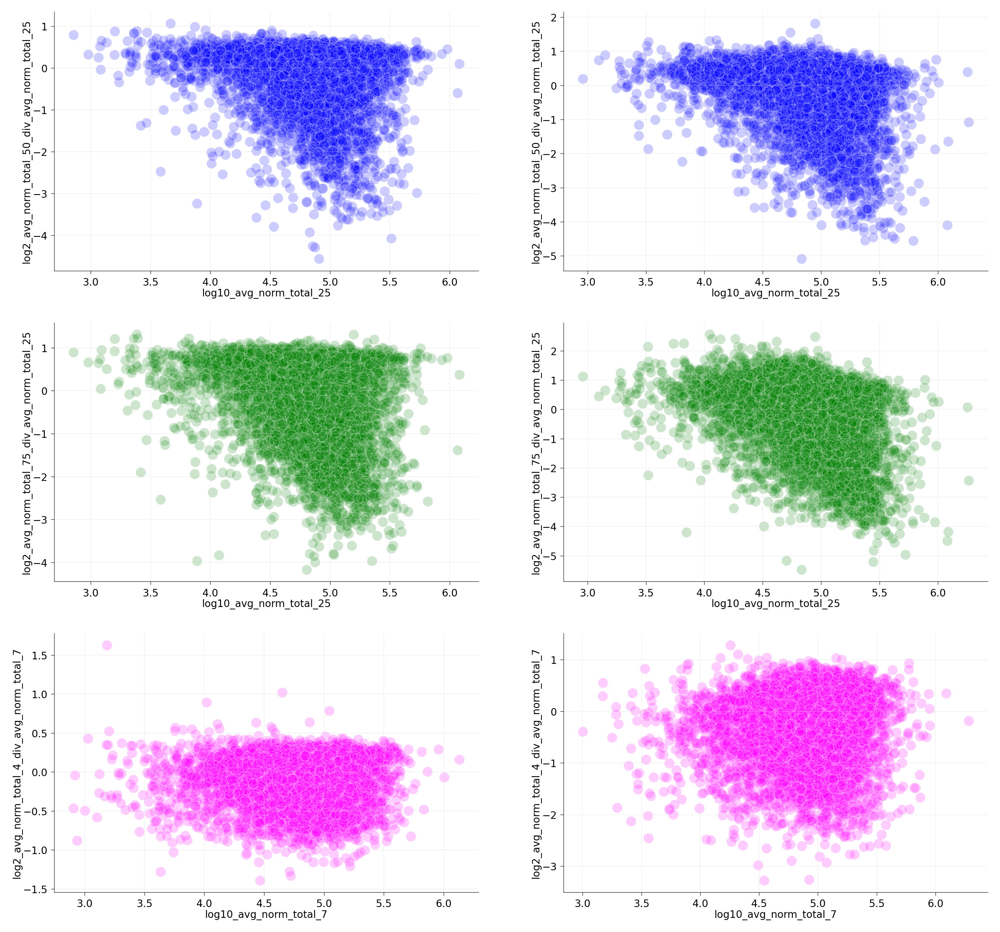

In [57]:
fig,axs = plt.subplots(3,2, figsize = (10,9.5))
sns.scatterplot(data = meta1_fc, x= 'log10_avg_norm_total_25', y = "log2_avg_norm_total_50_div_avg_norm_total_25" ,ax = axs[0,0], color = "blue", alpha = 0.2)
sns.scatterplot(data = meta2_fc, x= 'log10_avg_norm_total_25', y = "log2_avg_norm_total_50_div_avg_norm_total_25" ,ax = axs[0,1], color = "blue", alpha = 0.2)

sns.scatterplot(data = meta1_fc, x= 'log10_avg_norm_total_25', y = "log2_avg_norm_total_75_div_avg_norm_total_25", ax = axs[1,0], color = "green", alpha = 0.2)
sns.scatterplot(data = meta2_fc, x= 'log10_avg_norm_total_25', y = "log2_avg_norm_total_75_div_avg_norm_total_25", ax = axs[1,1], color = "green", alpha = 0.2)

sns.scatterplot(data = meta1_fc, x= 'log10_avg_norm_total_7', y = "log2_avg_norm_total_4_div_avg_norm_total_7", ax = axs[2,0], color = "magenta", alpha = 0.2)
sns.scatterplot(data = meta2_fc, x= 'log10_avg_norm_total_7', y = "log2_avg_norm_total_4_div_avg_norm_total_7", ax = axs[2,1], color = "magenta", alpha = 0.2)



<Axes: xlabel='log2_avg_norm_total_50_div_avg_norm_total_25', ylabel='log2_avg_norm_total_4_div_avg_norm_total_7'>

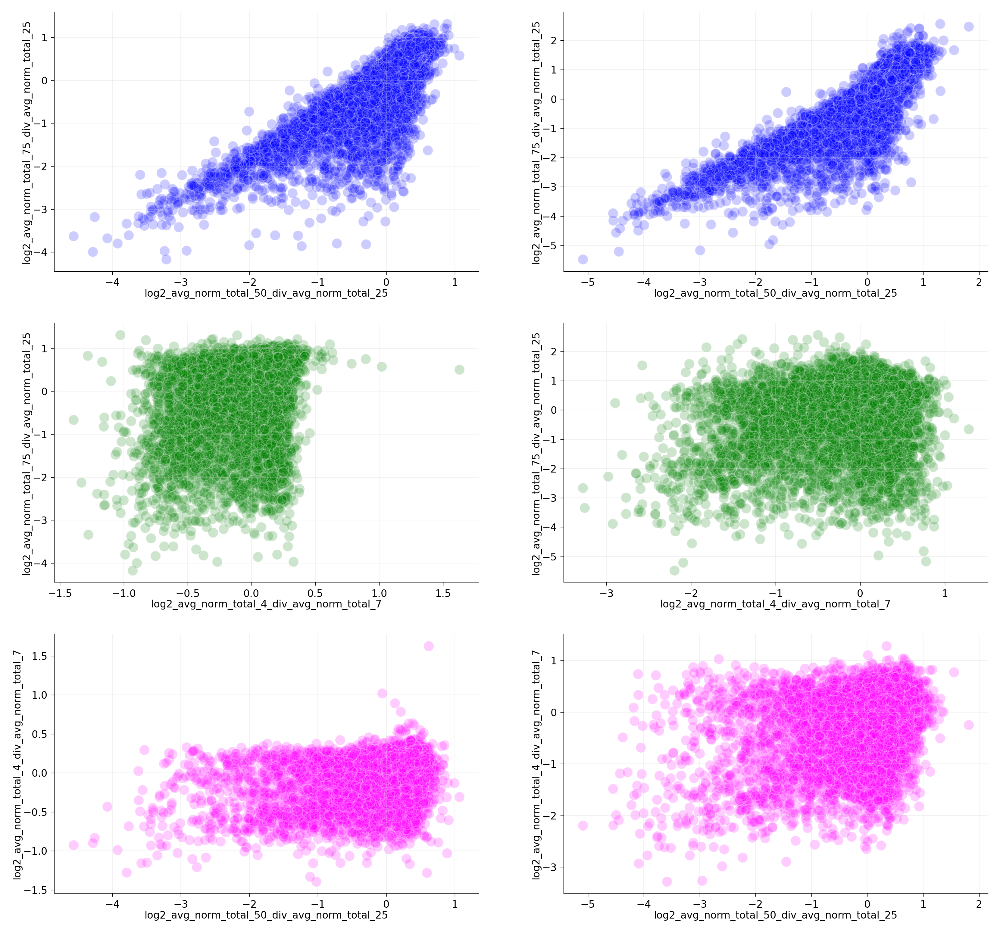

In [66]:
fig,axs = plt.subplots(3,2, figsize = (10,9.5))
sns.scatterplot(data = meta1_fc, x= 'log2_avg_norm_total_50_div_avg_norm_total_25', y = "log2_avg_norm_total_75_div_avg_norm_total_25" ,ax = axs[0,0], color = "blue", alpha = 0.2)
sns.scatterplot(data = meta2_fc, x= 'log2_avg_norm_total_50_div_avg_norm_total_25', y = "log2_avg_norm_total_75_div_avg_norm_total_25" ,ax = axs[0,1], color = "blue", alpha = 0.2)

sns.scatterplot(data = meta1_fc, x= 'log2_avg_norm_total_4_div_avg_norm_total_7', y = "log2_avg_norm_total_75_div_avg_norm_total_25", ax = axs[1,0], color = "green", alpha = 0.2)
sns.scatterplot(data = meta2_fc, x= 'log2_avg_norm_total_4_div_avg_norm_total_7', y = "log2_avg_norm_total_75_div_avg_norm_total_25", ax = axs[1,1], color = "green", alpha = 0.2)

sns.scatterplot(data = meta1_fc, x= 'log2_avg_norm_total_50_div_avg_norm_total_25', y = "log2_avg_norm_total_4_div_avg_norm_total_7", ax = axs[2,0], color = "magenta", alpha = 0.2)
sns.scatterplot(data = meta2_fc, x= 'log2_avg_norm_total_50_div_avg_norm_total_25', y = "log2_avg_norm_total_4_div_avg_norm_total_7", ax = axs[2,1], color = "magenta", alpha = 0.2)



### Calculate error in log 2 fold change measure

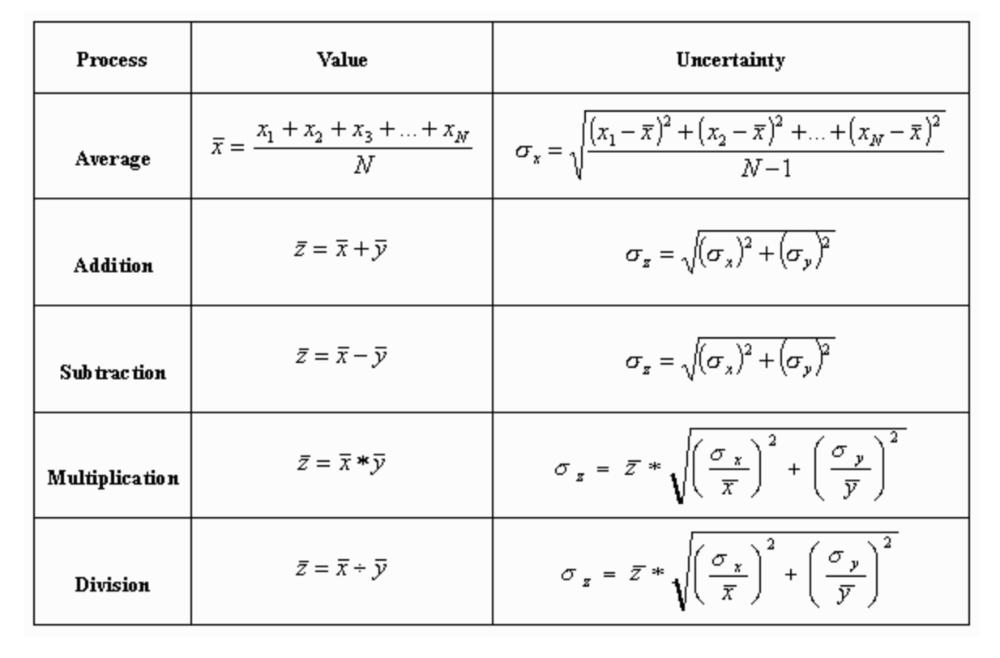

In [58]:
meta1_fc["error_prop_ratio_temp_50_log2"]=(((meta1_fc["std_norm_total_50"]/(meta1_fc["avg_norm_total_50"]*np.log(2)))**2 + (meta1_fc["std_norm_total_25"]/(meta1_fc["avg_norm_total_25"]*np.log(2)))**2)**(1/2)) * meta1_fc["avg_norm_total_50_div_avg_norm_total_25"]
meta1_fc["error_prop_ratio_temp_75_log2"]=(((meta1_fc["std_norm_total_75"]/(meta1_fc["avg_norm_total_75"]*np.log(2)))**2 + (meta1_fc["std_norm_total_25"]/(meta1_fc["avg_norm_total_25"]*np.log(2)))**2)**(1/2)) * meta1_fc["avg_norm_total_75_div_avg_norm_total_25"]
meta1_fc["error_prop_ratio_pH_4_log2"] = (((meta1_fc["std_norm_total_4"]/(meta1_fc["avg_norm_total_4"]*np.log(2)))**2 + (meta1_fc["std_norm_total_7"]/(meta1_fc["avg_norm_total_7"]*np.log(2)))**2)**(1/2)) * meta1_fc["avg_norm_total_4_div_avg_norm_total_7"]

meta2_fc["error_prop_ratio_temp_50_log2"]=(((meta2_fc["std_norm_total_50"]/(meta2_fc["avg_norm_total_50"]*np.log(2)))**2 + (meta2_fc["std_norm_total_25"]/(meta2_fc["avg_norm_total_25"]*np.log(2)))**2)**(1/2)) * meta2_fc["avg_norm_total_50_div_avg_norm_total_25"]
meta2_fc["error_prop_ratio_temp_75_log2"]=(((meta2_fc["std_norm_total_75"]/(meta1_fc["avg_norm_total_75"]*np.log(2)))**2 + (meta2_fc["std_norm_total_25"]/(meta2_fc["avg_norm_total_25"]*np.log(2)))**2)**(1/2)) * meta2_fc["avg_norm_total_75_div_avg_norm_total_25"]
meta2_fc["error_prop_ratio_pH_4_log2"] = (((meta2_fc["std_norm_total_4"]/(meta1_fc["avg_norm_total_4"]*np.log(2)))**2 + (meta2_fc["std_norm_total_7"]/(meta2_fc["avg_norm_total_7"]*np.log(2)))**2)**(1/2)) * meta2_fc["avg_norm_total_4_div_avg_norm_total_7"]
